In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import IPython.display as ipyd
from libs import gif, nb_utils
from libs import inception
from libs import vgg16
from libs import utils
from tensorflow.python.framework.ops import reset_default_graph
import random


IMAGE_HEIGHT = 224
IMAGE_WIDTH = 224
COLOR_CHANNEL_COUNT = 3

style_layers = ['conv1_2/conv1_2:0',
                'conv2_2/conv2_2:0',
                'conv3_2/conv3_2:0',
                'conv4_2/conv4_2:0',
                'conv5_2/conv5_2:0']

(950, 1200, 3)
(1, 950, 1200, 3)


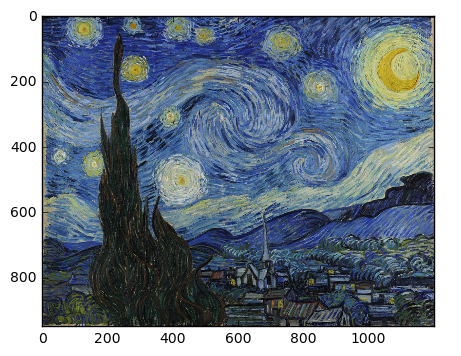

In [2]:
filepath = utils.download('http://lh6.ggpht.com/HlgucZ0ylJAfZgusynnUwxNIgIp5htNhShF559x3dRXiuy_UdP3UQVLYW6c=s1200')
style_og = plt.imread(filepath)#[15:-15, 190:-190, :]
plt.imshow(style_og)
print(style_og.shape)
#style_img = vgg16.preprocess(style_og)
style_img = style_og/255
style_img_4d = style_img[np.newaxis]
print(style_img_4d.shape)

In [3]:
image = style_img
print(image.shape)


(950, 1200, 3)


In [4]:
# Loss:
# Gram matrix for activations at layer 1 for ideal image, and for generated image. 
# Two times importing the vgg net -> get the activations at layers. 

# For each of the activations -> create gram matrix


## First, create the "style images" which will be used to create the loss function


In [5]:

def get_style_layer_vgg16(image,style_layer):
    net = vgg16.get_vgg_model()
    #style_layer = 'conv2_2/conv2_2:0'
    feature_transformed_image = tf.import_graph_def(
        net['graph_def'],
        name='vgg',
        input_map={'images:0': image},return_elements=[style_layer])
    feature_transformed_image = (feature_transformed_image[0])
    return feature_transformed_image


def get_gram_matrix(layer):
    input_shape = tf.shape(layer)
    image_size_without_batch = tf.gather(input_shape,[1,2,3])
    layer_shape = layer.get_shape().as_list()


    layer_size = tf.reduce_prod(image_size_without_batch)
    layer_flat = tf.reshape(layer, [-1, layer_shape[3]])
    gram_matrix = tf.matmul(tf.transpose(layer_flat), layer_flat) / tf.cast(layer_size,tf.float32)
    return gram_matrix

def get_style_loss(target,prediction,name_layer):
    feature_transformed_target = get_style_layer_vgg16(target,name_layer)    
    feature_transformed_prediction = get_style_layer_vgg16(prediction,name_layer)
    feature_count = tf.shape(feature_transformed_target)[3]
    target_gram = get_gram_matrix(feature_transformed_target)
    prediction_gram = get_gram_matrix(feature_transformed_prediction)
    the_size = (target_gram.shape[0]*target_gram.shape[1])
    the_size = int(the_size)
    style_loss = tf.nn.l2_loss((prediction_gram - target_gram) / np.float32(the_size))
    return style_loss


def create_optimizer_and_resulting_image(style_image,name_layer):
    reset_default_graph()
    g = tf.Graph()

    input_placeholder = tf.Variable(np.array([style_img]),trainable=False) #tf.placeholder(tf.float32, [1, 224,224,3]
    created = tf.Variable(tf.random_normal([1,224,224,3],mean=style_image.mean(),stddev=0.1))
    names = [op.name for op in g.get_operations()]
    pixel_loss = get_style_loss(input_placeholder,created,name_layer)
    style_optimizer = tf.train.AdamOptimizer().minimize(pixel_loss)
    return style_optimizer, pixel_loss, created

def get_layer_styles(style_image):
    style_imgs = list()
    for name_layer in style_layers:
        optimizer,loss,resulting_image = create_optimizer_and_resulting_image(style_image,name_layer)
        sess = tf.InteractiveSession()
        sess.run(tf.global_variables_initializer())
        for i in range(500):
            _,l,show = sess.run([optimizer,loss,resulting_image])
        final_image = sess.run(resulting_image)
        style_imgs.append(final_image)
    #print(l)
    return style_imgs
#style = get_layer_styles(style_img_4d)


In [6]:
# for img in style:
#     plt.imshow(img[0])
#     plt.show()

# Getting the content activation of these images

- load the vgg layer
- get the content at layer 2


In [7]:
#style[0].shape

In [8]:
# tf.reset_default_graph()
# content_layer = "conv2_2/conv2_2:0"
# net = vgg16.get_vgg_model()
# input_placeholder = tf.placeholder(tf.float32, style[0].shape)
# perceived_content = tf.import_graph_def(net['graph_def'],
#                                                 name='vgg',
#                                                 input_map={'images:0': input_placeholder},
#                                                 return_elements=[content_layer])


In [9]:
# sess = tf.InteractiveSession()
# sess.run(tf.global_variables_initializer())
# perceived_styles = []
# for image in style:
#     perceived = sess.run(perceived_content, feed_dict={input_placeholder:image})
#     print(perceived[0].shape)
#     perceived_styles.append(perceived[0])


In [10]:

def get_important_layers_vgg16(image):
    net = vgg16.get_vgg_model()
    
    important_layers = ['conv1_2/conv1_2:0',
                'conv2_2/conv2_2:0',
                'conv3_2/conv3_2:0',
                'conv4_2/conv4_2:0',
                'conv5_2/conv5_2:0']
    feature_transformed_images = tf.import_graph_def(
        net['graph_def'],
        name='vgg',
        input_map={'images:0': image},return_elements=important_layers)
    return feature_transformed_images

def conv_layer(input_image,ksize,in_channels,out_channels,stride,scope_name,activation_function=tf.nn.relu):
    with tf.variable_scope(scope_name):
        filter = tf.Variable(tf.random_normal([ksize,ksize,in_channels,out_channels],stddev=0.03))
        output = tf.nn.conv2d(input_image,filter, strides=[1, stride, stride, 1], padding='SAME')
        if activation_function:
            output = activation_function(output)
        return output, filter
    
def residual_layer(input_image,ksize,in_channels,out_channels,stride,scope_name):
    with tf.variable_scope(scope_name):
        output,out_weights = conv_layer(input_image,ksize,in_channels,out_channels,stride,scope_name+"conv1")
        output,out_weights = conv_layer(output,ksize,out_channels,out_channels,stride,scope_name+"conv2")
        cool_stuff = tf.add(output,tf.identity(input_image))
        return cool_stuff,out_weights
    
def transpose_deconvolution_layer(input_tensor,used_weights,new_shape,stride,scope_name):
    with tf.variable_scope(scope_name):
        output = tf.nn.conv2d_transpose(input_tensor, used_weights, output_shape=new_shape,strides=[1,stride,stride,1], padding='SAME')
        output = tf.nn.relu(output)
        return output
    
def resize_deconvolution_layer(input_tensor,used_weights,stride,scope_name):
    with tf.variable_scope(scope_name):
        input_shape = tf.shape(input_tensor)
        image_shape = tf.gather(input_shape,[1,2])
        color_channels = input_tensor.get_shape().as_list()
        image_shape = 2*image_shape
        output = tf.image.resize_images(input_tensor,image_shape)#tf.nn.conv2d_transpose(input_tensor, used_weights, output_shape=new_shape,strides=[1,stride,stride,1], padding='SAME')
        output, unused_weights = conv_layer(output,3,color_channels[3],color_channels[3]//2,1,scope_name+"_awesome_deconv")
        return output

def deconvolution_layer(input_tensor,used_weights,stride,scope_name):
    return resize_deconvolution_layer(input_tensor,used_weights,stride,scope_name)

    
def output_between_zero_and_one(output):
    output +=1 
    return output/2

In [11]:
tf.reset_default_graph()
sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())
style_placeholder = tf.placeholder(tf.float32, [None, None,None,COLOR_CHANNEL_COUNT])
perceived_style = get_important_layers_vgg16(style_placeholder)
perceived_grams = []
for ab in perceived_style:
    perceived_grams.append(get_gram_matrix(ab))

evaluated_grams_styles = []
for a in perceived_grams:
    this_layer = a.eval(feed_dict={style_placeholder: style_img_4d})
    evaluated_grams_styles.append(this_layer)
#     print(this_layer.shape)
#     evaluated_styles.append(this_layer)
    

#      perc_style = tf.Variable(evalueated_perc_style,trainable=False)
#         grams_style = get_gram_matrix(perc_style)
#         evalueated_perc_style = evaluated_styles[index]
#         grams_style = tf.Variable(evaluated_grams_styles[index],trainable=False)

# create network that optimises style loss, content loss, and smooth loss

In [12]:
tf.reset_default_graph()



net = vgg16.get_vgg_model()
def get_content_layer_vgg16(image):
    with tf.variable_scope("foo",reuse=True):
        content_layer = 'conv2_2/conv2_2:0'
        feature_transformed_image = tf.import_graph_def(
            net['graph_def'],
            name='vgg',
            input_map={'images:0': image},return_elements=[content_layer])
        feature_transformed_image = (feature_transformed_image[0])
    return feature_transformed_image

def get_content_loss(target,prediction):
    feature_transformed_target = get_content_layer_vgg16(target)    
    feature_transformed_prediction = get_content_layer_vgg16(prediction)
    feature_count = tf.shape(feature_transformed_target)[3]*tf.shape(feature_transformed_target)[2]*tf.shape(feature_transformed_target)[1]
    content_loss = tf.reduce_sum(tf.square(feature_transformed_target-feature_transformed_prediction))
    content_loss = content_loss/tf.cast(feature_count, tf.float32)
    return content_loss

# def style_loss(image,style_img):
#     total_loss = 0.0
#     style_layer = tf.Variable(style_img,trainable=False)
#     total_loss += get_content_loss(style_layer,image)
#     return total_loss
    
    
def get_smooth_loss(image):
    batch_count = tf.shape(image)[0]
    image_height = tf.shape(image)[1]
    image_width = tf.shape(image)[2]    

    horizontal_normal = tf.slice(image, [0, 0, 0,0], [batch_count, image_height, image_width-1,3])
    horizontal_one_right = tf.slice(image, [0, 0, 1,0], [batch_count, image_height, image_width-1,3])
    vertical_normal = tf.slice(image, [0, 0, 0,0], [batch_count, image_height-1, image_width,3])
    vertical_one_right = tf.slice(image, [0, 1, 0,0], [batch_count, image_height-1, image_width,3])
    smooth_loss = tf.nn.l2_loss(horizontal_normal-horizontal_one_right)+tf.nn.l2_loss(vertical_normal-vertical_one_right)
    return smooth_loss

def get_pixel_loss(target,prediction):
    pixel_difference = target - prediction
    pixel_loss = tf.nn.l2_loss(pixel_difference)
    return pixel_loss

input_placeholder = tf.placeholder(tf.float32, [None, None,None,COLOR_CHANNEL_COUNT])
# output_placeholder = tf.placeholder(tf.float32,[None, IMAGE_HEIGHT,IMAGE_WIDTH,COLOR_CHANNEL_COUNT])
computed_batch_size = tf.shape(input_placeholder)[0]

conv1, conv1_weights = conv_layer(input_placeholder,9,COLOR_CHANNEL_COUNT,32,1,"conv1")
conv2, conv2_weights = conv_layer(conv1,3,32,64,2,"conv2")
conv3, conv3_weights = conv_layer(conv2,3,64,128,2,"conv3")
res1, res1_weights = residual_layer(conv3,3,128,128,1,"res1")
res2, res2_weights = residual_layer(res1,3,128,128,1,"res2")
res3, res3_weights = residual_layer(res2,3,128,128,1,"res3")
res4, res4_weights = residual_layer(res3,3,128,128,1,"res4")
print(res2)
deconv1 = deconvolution_layer(res4,conv2_weights,2,'deconv1')
deconv2 = deconvolution_layer(deconv1,conv3_weights,2,'deconv2')

conv4, conv4_weights = conv_layer(deconv2,9,32,3,1,"last_layer",activation_function=tf.nn.tanh)
output = output_between_zero_and_one(conv4)

# print(output_placeholder)
print(output)

def get_style_loss(image,style_image):
    perceived_image = get_important_layers_vgg16(image)
    style_layer_loss_factors = [0.3,0.4,2.0,1.5,1.0]
#     perceived_style = get_important_layers_vgg16(style_image)
    total_style_loss = 0.0
    for index,perc_layer in enumerate(perceived_image):
        
        grams_image = get_gram_matrix(perc_layer)
        #print(evalueated_perc_style)
        grams_style = tf.Variable(evaluated_grams_styles[index],trainable=False)
        dif = grams_image - grams_style
        total_style_loss += style_layer_loss_factors[index]*tf.sqrt(tf.reduce_sum(tf.square(dif)))#tf.nn.l2_loss(dif)
    return total_style_loss

#     seen_style_this_image = get_content_layer_vgg16(image)
#     for must_have_style in perceived_styles:
#         total_style_loss += tf.square(must_have_style - seen_style_this_image)
#     total_style_loss = tf.sqrt(total_style_loss)
#     return total_style_loss
#pixel_loss = get_pixel_loss(output_placeholder,output)
style_loss = get_style_loss(output,style_placeholder) #style_loss(output,style[2]))/(224*224*4) #get_content_loss(output_placeholder,output)
#content_loss += (style_loss(output,style[1]))/(224*224*4) 
#style_loss = get_style_loss()
content_loss = get_content_loss(input_placeholder,output)
smooth_loss = get_smooth_loss(output)

style_factor = 1.0
content_factor = 0.25
pixel_factor = 1.0
smooth_factor = 0.0001

loss = style_factor*style_loss + content_factor*content_loss+smooth_factor*smooth_loss

optimizer = tf.train.AdamOptimizer().minimize(loss)

Tensor("res2/Add:0", shape=(?, ?, ?, 128), dtype=float32)
Tensor("truediv:0", shape=(?, ?, ?, 3), dtype=float32)
[<tf.Tensor 'vgg/conv1_2/conv1_2:0' shape=(?, ?, ?, 64) dtype=float32>, <tf.Tensor 'vgg/conv2_2/conv2_2:0' shape=(?, ?, ?, 128) dtype=float32>, <tf.Tensor 'vgg/conv3_2/conv3_2:0' shape=(?, ?, ?, 256) dtype=float32>, <tf.Tensor 'vgg/conv4_2/conv4_2:0' shape=(?, ?, ?, 512) dtype=float32>, <tf.Tensor 'vgg/conv5_2/conv5_2:0' shape=(?, ?, ?, 512) dtype=float32>]
[<tf.Tensor 'vgg/conv1_2/conv1_2:0' shape=(?, ?, ?, 64) dtype=float32>, <tf.Tensor 'vgg/conv2_2/conv2_2:0' shape=(?, ?, ?, 128) dtype=float32>, <tf.Tensor 'vgg/conv3_2/conv3_2:0' shape=(?, ?, ?, 256) dtype=float32>, <tf.Tensor 'vgg/conv4_2/conv4_2:0' shape=(?, ?, ?, 512) dtype=float32>, <tf.Tensor 'vgg/conv5_2/conv5_2:0' shape=(?, ?, ?, 512) dtype=float32>]
Tensor("truediv_1:0", shape=(64, 64), dtype=float32)
Tensor("Variable/read:0", shape=(64, 64), dtype=float32)
^^^grams
Tensor("truediv_2:0", shape=(128, 128), dtype=fl

In [13]:
sess = tf.InteractiveSession()
sess.run(tf.global_variables_initializer())

import os
import random
COCO_PATH = "/home/roland/datasets/coco/val2014"
COCO_IMAGES = os.listdir(COCO_PATH)

import skimage.transform as transform# resize(image, output_shape, order=1, mode=None, cval=0, clip=True, preserve_range=False)[source]
def show_many_images(*images):
    fig = plt.figure()
    for i in range(len(images)):
        subplot_number = 100+10*len(images)+(i+1)
        plt.subplot(subplot_number)
        plt.imshow(images[i])
    plt.show()
#    print "I was called with", len(arg), "arguments:", arg

def show_progress(input_image,target,generated):
    fig = plt.figure()

    plt.subplot(131)
    plt.imshow(input_image,cmap='gray')
    plt.subplot(132)
    plt.imshow(target)
    plt.subplot(133)
    plt.imshow(generated)
    plt.show()
    
def get_train_images(count):
    images = []
    for _ in range(count):
        random_img = random.choice(COCO_IMAGES)
        random_img = os.path.join(COCO_PATH,random_img)
        image = plt.imread(random_img)
        image = transform.resize(image,(224,224))
        images.append(image)
    return images

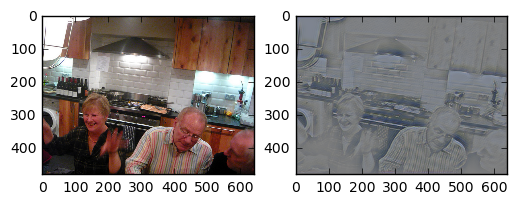

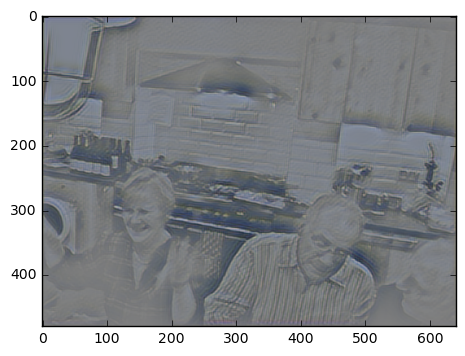

loss at 1: 363492.84375
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


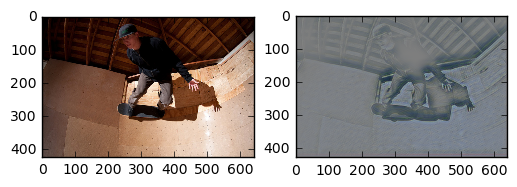

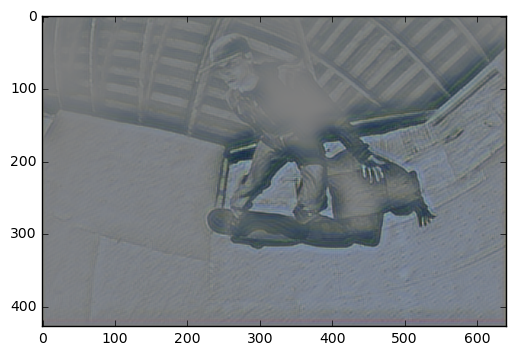

loss at 501: 230261.09375
could not broadcast input array from shape (224,224,3) into shape (224,224)


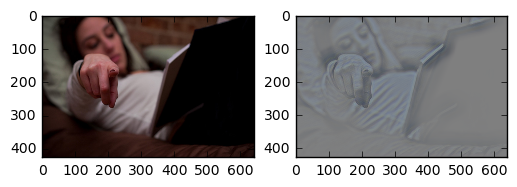

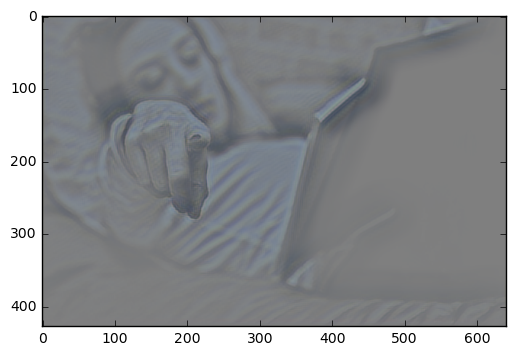

loss at 1001: 206051.765625
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


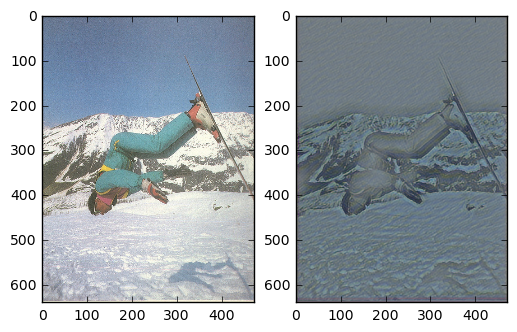

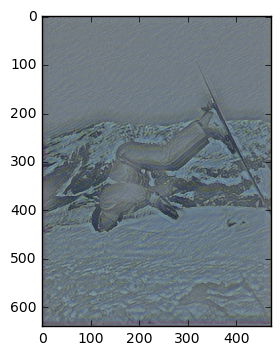

loss at 1501: 177582.3125
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


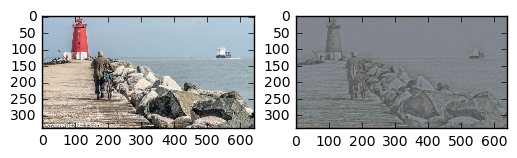

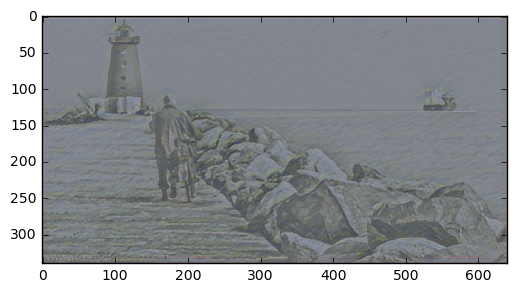

loss at 2001: 228321.5
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


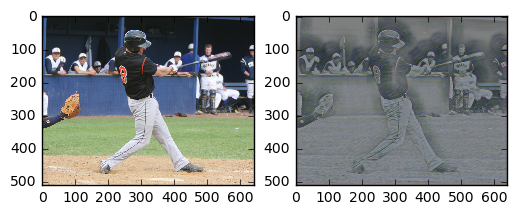

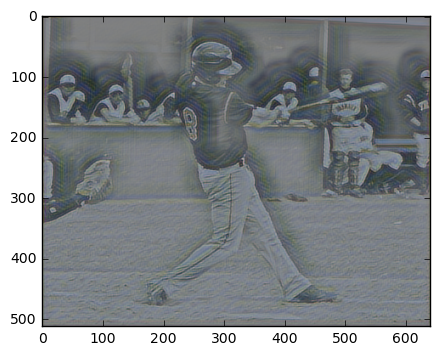

loss at 2501: 259636.40625
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


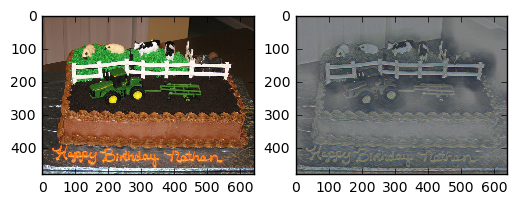

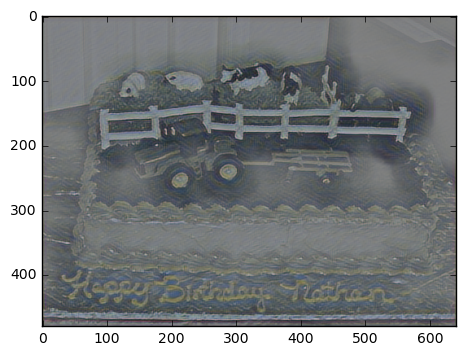

loss at 3001: 263070.78125
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


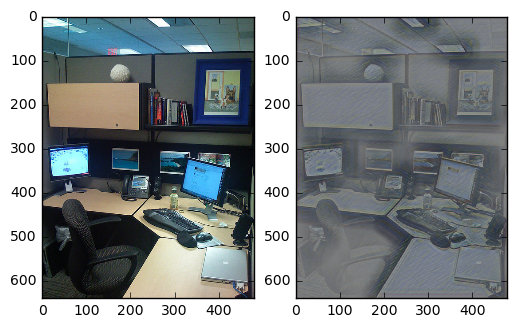

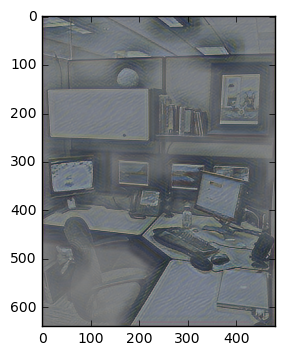

loss at 3501: 167896.265625
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


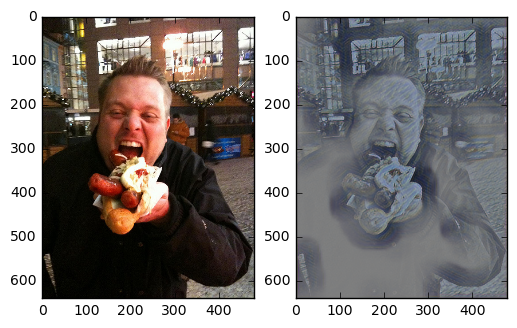

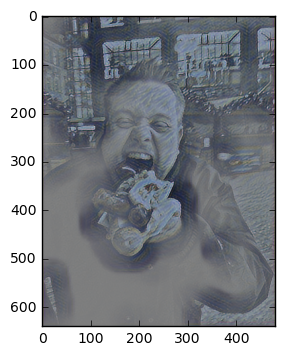

loss at 4001: 206787.59375
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


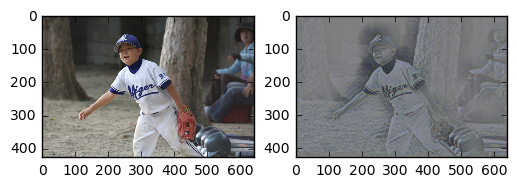

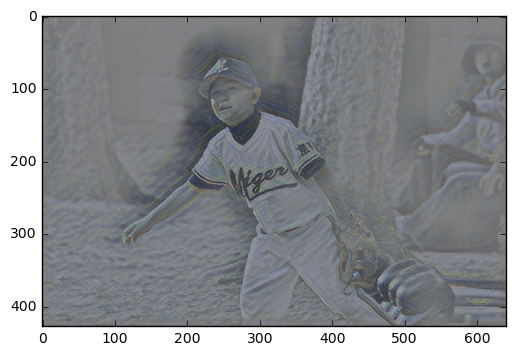

loss at 4501: 184876.015625
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


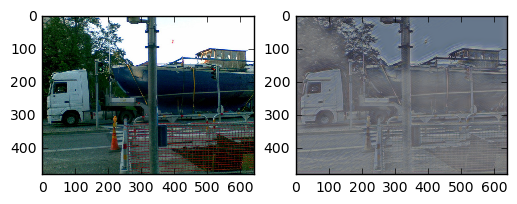

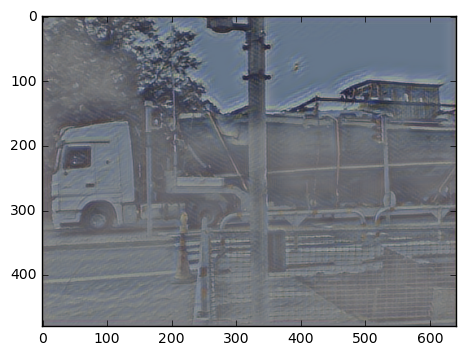

loss at 5001: 182859.390625
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


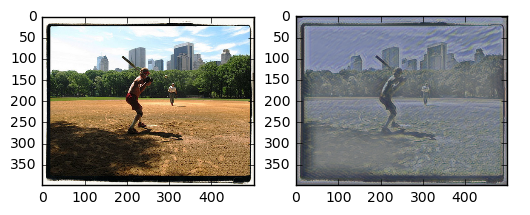

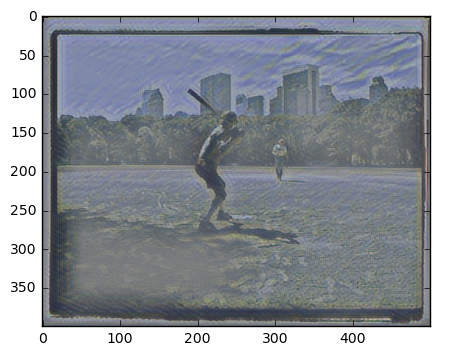

loss at 5501: 181437.578125


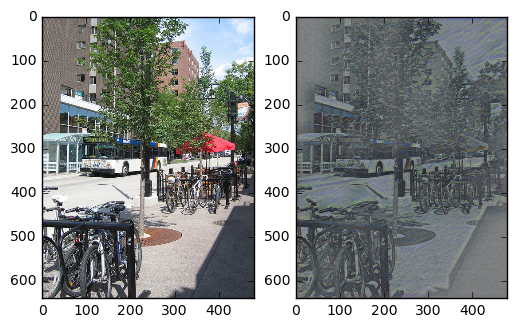

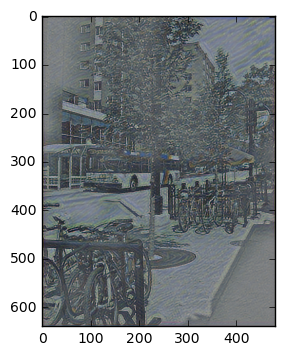

loss at 6001: 162729.203125
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


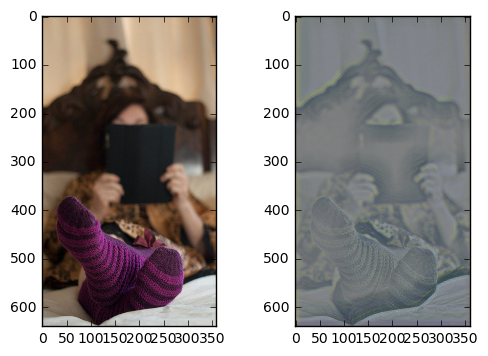

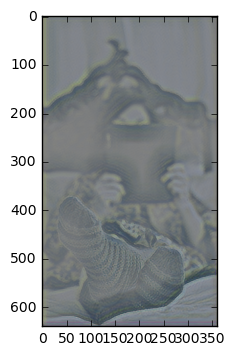

loss at 6501: 195083.359375
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


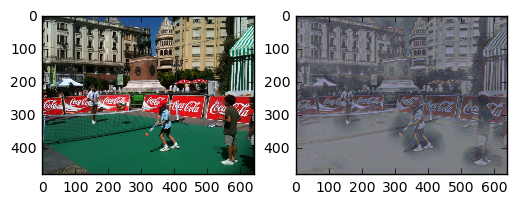

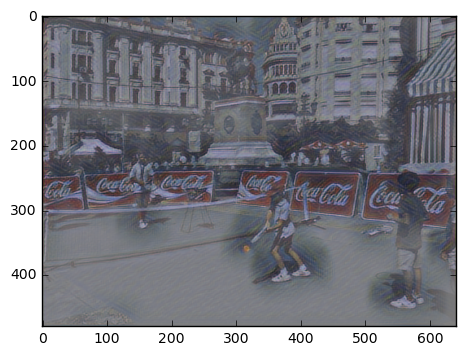

loss at 7001: 167614.96875
could not broadcast input array from shape (224,224,3) into shape (224,224)


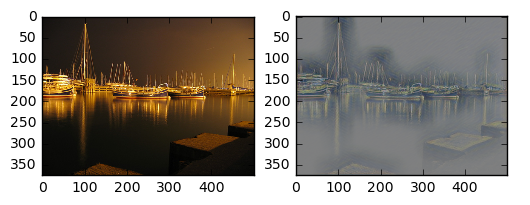

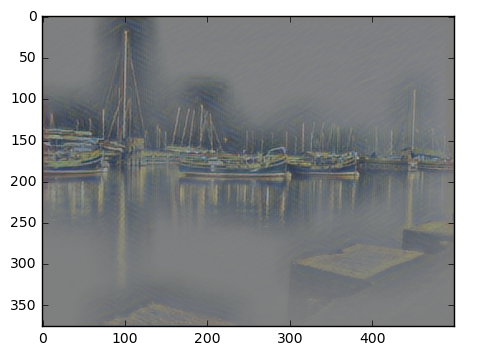

loss at 7501: 180923.4375
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


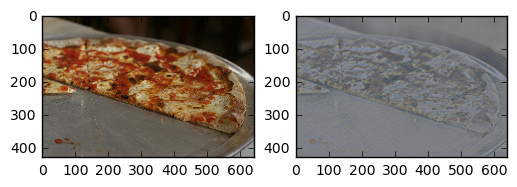

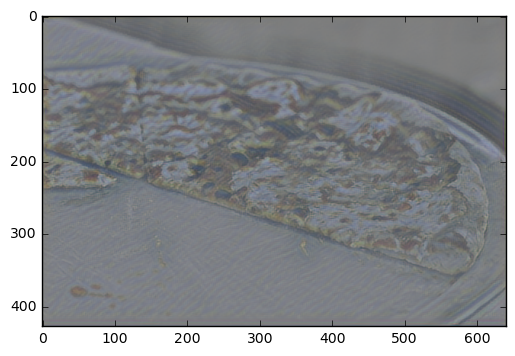

loss at 8001: 250032.6875
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


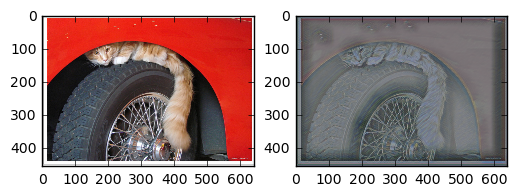

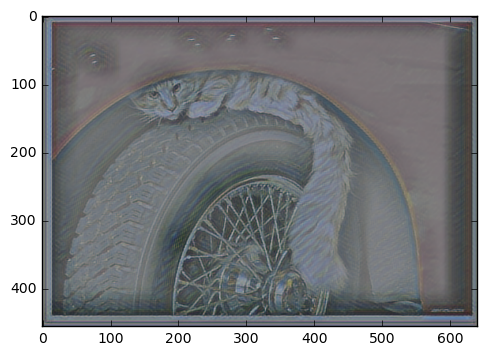

loss at 8501: 157115.71875
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


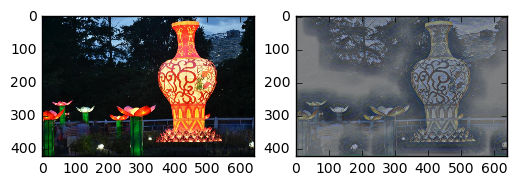

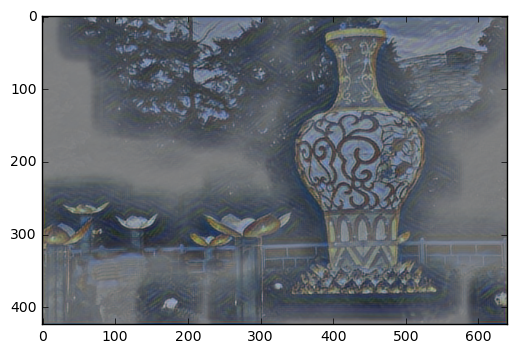

loss at 9001: 152635.640625
could not broadcast input array from shape (224,224,3) into shape (224,224)


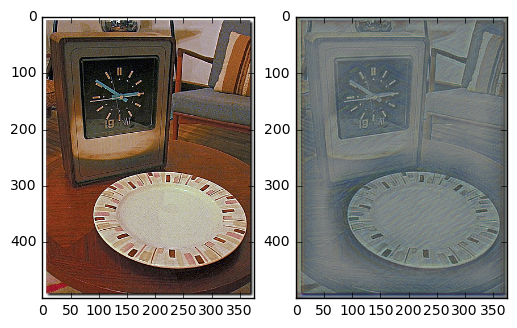

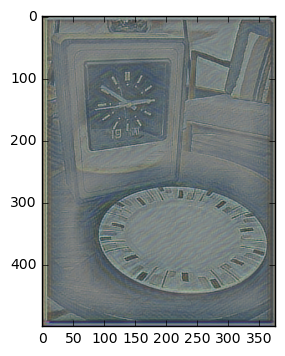

loss at 9501: 195952.59375
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


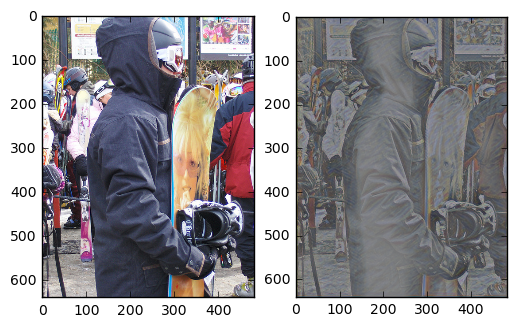

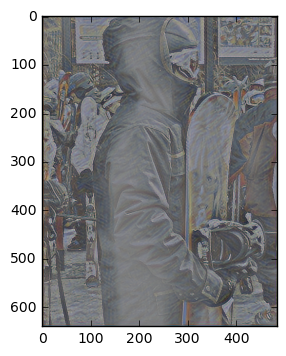

loss at 10001: 175388.578125
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


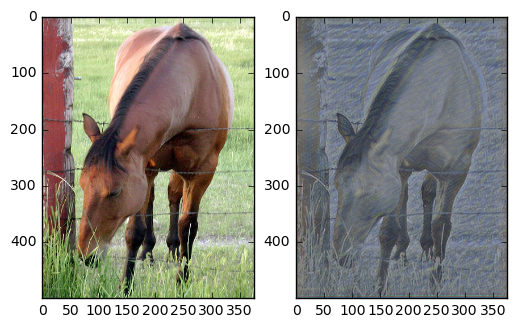

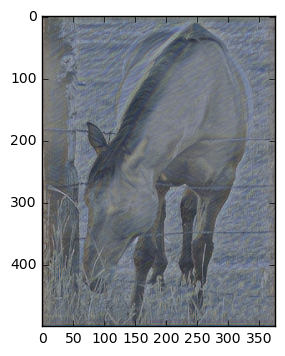

loss at 10501: 139922.5
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


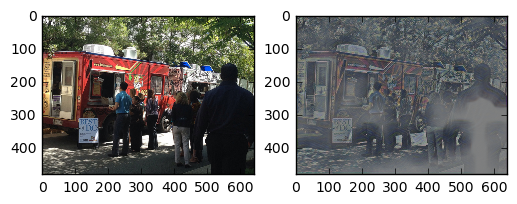

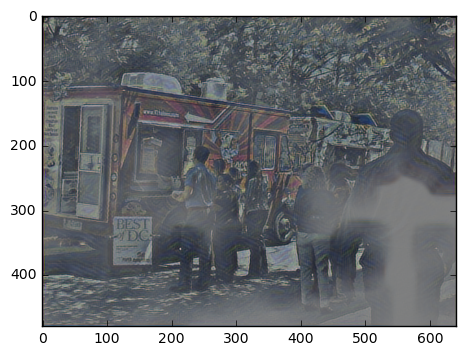

loss at 11001: 171106.84375
could not broadcast input array from shape (224,224,3) into shape (224,224)


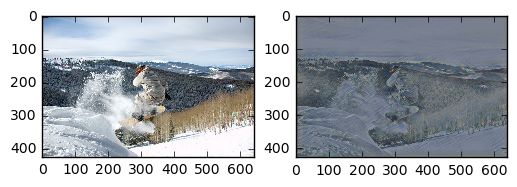

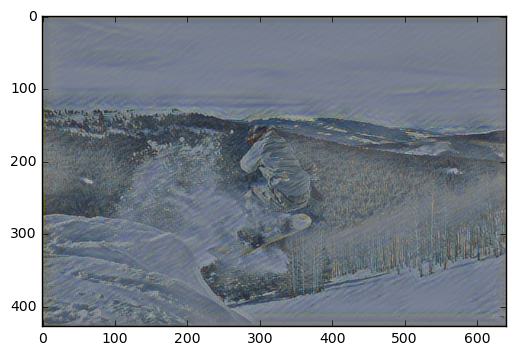

loss at 11501: 196989.203125
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


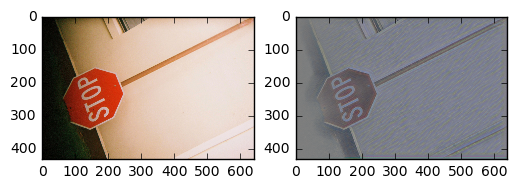

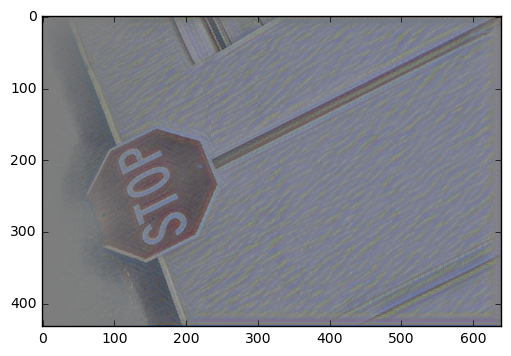

loss at 12001: 215520.4375
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


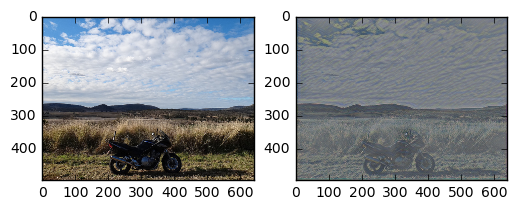

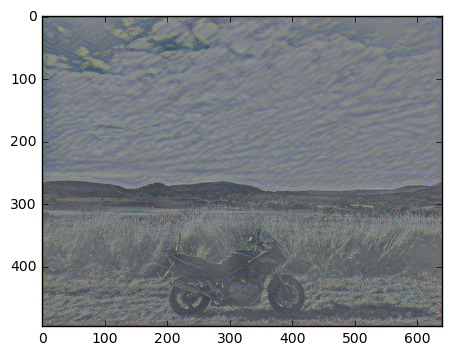

loss at 12501: 275073.65625
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


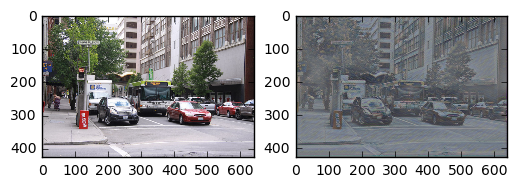

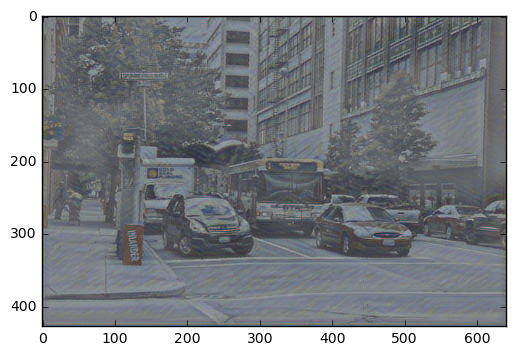

loss at 13001: 208039.390625
could not broadcast input array from shape (224,224,3) into shape (224,224)


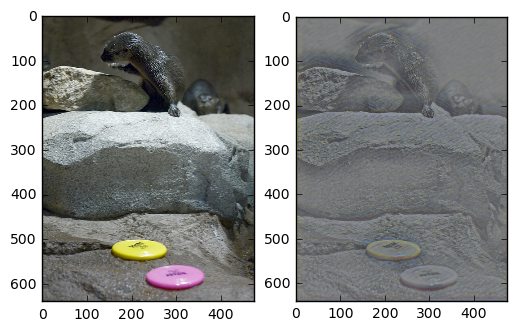

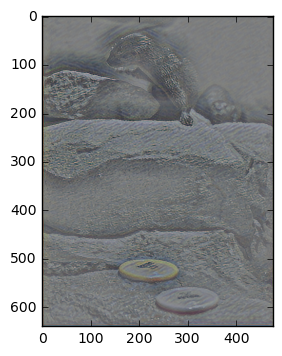

loss at 13501: 192739.1875
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


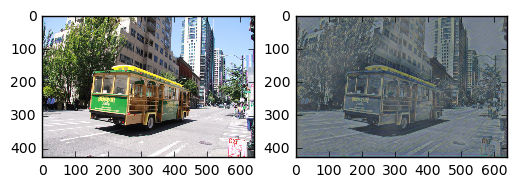

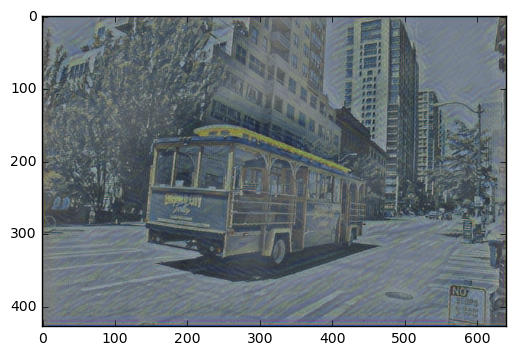

loss at 14001: 187831.453125
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


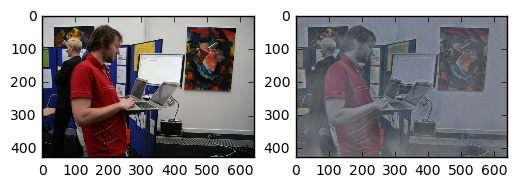

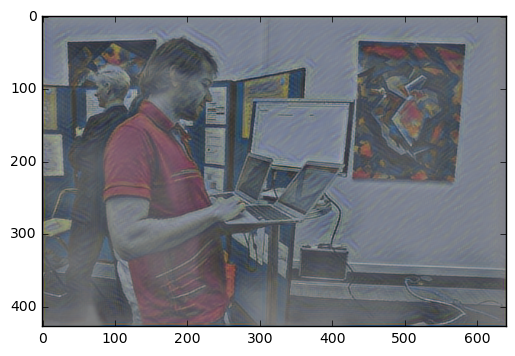

loss at 14501: 152527.015625
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


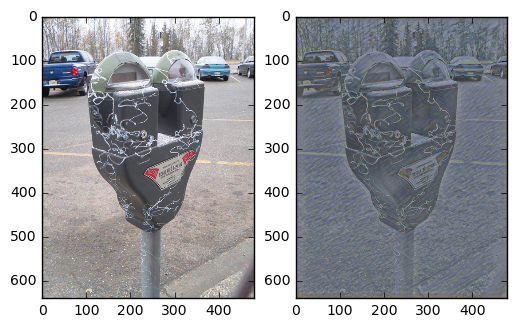

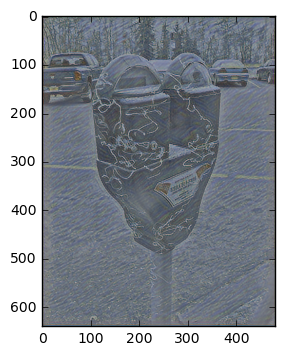

loss at 15001: 161966.921875
could not broadcast input array from shape (224,224,3) into shape (224,224)
could not broadcast input array from shape (224,224,3) into shape (224,224)


KeyboardInterrupt: 

In [18]:


n_epochs = 40000
batch_size = 4

for epoch_i in range(n_epochs):
   # print(epoch_i)
    try:
        in_x = get_train_images(batch_size)
        #print(in_x[0])
        in_x = np.array(in_x)
        #print(in_x.shape)
        #in_x = np.expand_dims(in_x,3)

        _,l,cl,sl = sess.run([optimizer,loss,content_loss,style_loss], feed_dict={input_placeholder:in_x})
       # print(pl)
      #  print(sl)
      #  print(cl)
     #   print(epoch_i)
        if epoch_i % 500==1:
            random_img = random.choice(COCO_IMAGES)
            random_img = os.path.join(COCO_PATH,random_img)
            image = plt.imread(random_img)
            in_x = np.array([image])
            in_x = in_x/255
            colored_images = sess.run(output, feed_dict={input_placeholder:in_x})
            generated = np.clip(colored_images,0.0,1.0)
            generated = generated[0]
            show_many_images(in_x[0],generated)
            show_many_images(generated)
            print("loss at {0}: {1}".format(epoch_i,l))
    except Exception as e:
        print(e)


In [ ]:
((sl/4)/224)/224


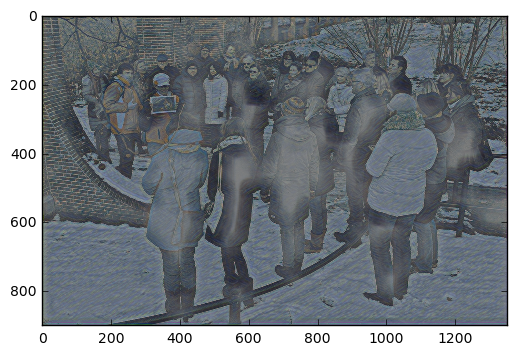

In [24]:
nander = "https://images4.persgroep.net/rcs/zsSO42zVXNIc5xolbMoy5F1aIp4/diocontent/76226482/_fill/1350/900/?appId=21791a8992982cd8da851550a453bd7f&quality=0.9"
nander = utils.download(nander)
from PIL import Image

nander = plt.imread(nander)

nander = np.array([nander])

in_x = nander/255
colored_images = sess.run(output, feed_dict={input_placeholder:in_x})
plt.imshow(colored_images[0])